# Comparativa entre YOLOv5m y YOLOv8m usando conjunto de prueba

Este análisis tiene como objetivo comparar el rendimiento de dos modelos (YOLOv5m y YOLOv8m) sobre un conjunto de imágenes de galaxias, usando como referencia etiquetas. Se evalúan métricas clave como precisión, recall, F1-score y se visualiza la matriz de confusión.

---

In [25]:
import pandas as pd

# Cargar archivos CSV
v5_csv = 'runs/detect/bar_detector_sample/results.csv'
v8_csv = 'runs/detect/bar_detector_yolov8/results.csv'

v5_df = pd.read_csv(v5_csv)
v8_df = pd.read_csv(v8_csv)

# Limpiar espacios en los nombres de columnas del CSV de YOLOv5
v5_df.columns = v5_df.columns.str.strip()

# Obtener la última fila de métricas (última época)
v5_last = v5_df.iloc[-1]
v8_last = v8_df.iloc[-1]

# Crear tabla comparativa
comparison = pd.DataFrame({
    'Métrica': ['Precisión', 'Recall', 'mAP@0.5', 'mAP@0.5:0.95'],
    'YOLOv5m': [
        v5_last['metrics/precision'],
        v5_last['metrics/recall'],
        v5_last['metrics/mAP_0.5'],
        v5_last['metrics/mAP_0.5:0.95']
    ],
    'YOLOv8m': [
        v8_last['metrics/precision(B)'],
        v8_last['metrics/recall(B)'],
        v8_last['metrics/mAP50(B)'],
        v8_last['metrics/mAP50-95(B)']
    ]
})

display(comparison)


,Métrica,YOLOv5m,YOLOv8m
0,Precisión,0.64577,0.54177
1,Recall,0.77514,0.93500
2,mAP@0.5,0.68929,0.63092
3,mAP@0.5:0.95,0.59067,0.63092


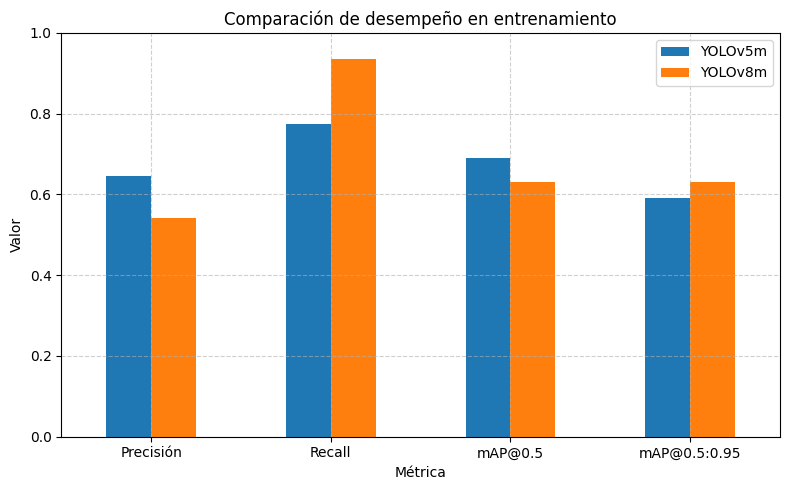

In [26]:
import matplotlib.pyplot as plt

comparison.set_index('Métrica').plot(kind='bar', figsize=(8,5))
plt.title('Comparación de desempeño en entrenamiento')
plt.ylabel('Valor')
plt.ylim(0, 1)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


## Comparación de desempeño durante el entrenamiento: YOLOv5m vs YOLOv8m

En esta sección se comparan los resultados de entrenamiento obtenidos por los modelos YOLOv5m y YOLOv8m utilizando el mismo conjunto de datos. La comparación se basa en cuatro métricas clave evaluadas durante la validación del proceso de entrenamiento:

- **Precisión (Precision)**: mide la proporción de verdaderos positivos sobre el total de predicciones positivas realizadas.
- **Recall**: evalúa la capacidad del modelo para encontrar todas las instancias positivas reales.
- **mAP @0.5**: mean Average Precision con un umbral de IoU de 0.5.
- **mAP @0.5:0.95**: media de mAP sobre múltiples umbrales de IoU, representa una evaluación más estricta.

### Tabla comparativa de métricas finales

| Métrica         | YOLOv5m | YOLOv8m |
|-----------------|---------|---------|
| Precisión       | 0.6458  | 0.5418  |
| Recall          | 0.7751  | 0.9350  |
| mAP @0.5         | 0.6893  | 0.6309  |
| mAP @0.5:0.95    | 0.5907  | 0.6309  |

### Gráfico comparativo

Se observa que:

- **YOLOv5m** obtiene una mejor precisión y mAP @0.5.
- **YOLOv8m** logra un recall significativamente más alto y un mAP @0.5:0.95 ligeramente superior.

Esto indica que YOLOv8m es más sensible para detectar objetos, pero YOLOv5m es más preciso al momento de hacerlo. La elección del modelo dependerá del objetivo: si se prioriza detectar todas las instancias (recall), YOLOv8m podría ser preferible; si se quiere reducir los falsos positivos, YOLOv5m tiene una ligera ventaja.


# Comparación de rendimiento

In [28]:
import os
import pandas as pd
import shutil

# Rutas
image_base_path = '../data/processed/'   
csv_path = '../data/dataset.csv'
output_img_path = 'images/test'
output_lbl_path = 'labels/test'  # si necesitas etiquetas, opcional

# Cargar y preparar datos
df = pd.read_csv(csv_path)
df = df[df["Bars"] >= 0].copy()
df["has_bar"] = df["Bars"].apply(lambda x: 1 if x > 0 else 0)
df["image_path"] = df["name"].apply(lambda x: os.path.join(image_base_path, f"{x}.png"))

# Tomar muestra balanceada: 200 con barra, 200 sin barra
sample_df = (
    df.groupby("has_bar", group_keys=False)
    .apply(lambda x: x.sample(n=200, random_state=42))
    .reset_index(drop=True)
)

# Crear carpeta destino (limpiar si ya existe)
shutil.rmtree(output_img_path, ignore_errors=True)
os.makedirs(output_img_path, exist_ok=True)

# Copiar imágenes
for _, row in sample_df.iterrows():
    img_name = os.path.basename(row['image_path'])
    dst = os.path.join(output_img_path, img_name)
    shutil.copy(row['image_path'], dst)

# Verificación
print("Conjunto de prueba creado:")
print(sample_df["has_bar"].value_counts())
print(sample_df["has_bar"].value_counts(normalize=True))


/var/folders/d2/x4hsqgc96j5gq48f813m7zq40000gn/T/ipykernel_1525/2299885326.py:20: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=200, random_state=42))


Conjunto de prueba creado:
has_bar
0    200
1    200
Name: count, dtype: int64
has_bar
0    0.5
1    0.5
Name: proportion, dtype: float64


# YOLOv8m


0: 416x416 1 bar, 62.8ms
1: 416x416 1 bar, 62.8ms
2: 416x416 1 bar, 62.8ms
3: 416x416 1 bar, 62.8ms
4: 416x416 1 bar, 62.8ms
5: 416x416 (no detections), 62.8ms
6: 416x416 1 bar, 62.8ms
7: 416x416 1 bar, 62.8ms
8: 416x416 1 bar, 62.8ms
9: 416x416 1 bar, 62.8ms
10: 416x416 1 bar, 62.8ms
11: 416x416 1 bar, 62.8ms
12: 416x416 1 bar, 62.8ms
13: 416x416 1 bar, 62.8ms
Speed: 0.7ms preprocess, 62.8ms inference, 0.2ms postprocess per image at shape (1, 3, 416, 416)


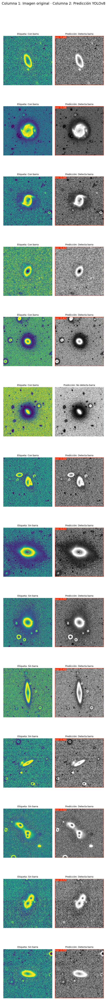

In [17]:
import os
import pandas as pd
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# 1. Paths
image_base_path = '/Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/data/processed'
csv_path = '/Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/data/dataset.csv'

# 2. Cargar CSV y preparar rutas
df = pd.read_csv(csv_path)
df['has_bar'] = df['Bars'].apply(lambda x: 1 if x > 0 else 0)
df['image_path'] = df['name'].apply(lambda x: os.path.join(image_base_path, f"{x}.png"))

# 3. Filtrar imágenes existentes
df = df[df['image_path'].apply(os.path.exists)]

# 4. Seleccionar 15 con barra y 15 sin barra
with_bar_pool = df[df['has_bar'] == 1]
without_bar_pool = df[df['has_bar'] == 0]

with_bar = with_bar_pool.sample(min(7, len(with_bar_pool)), random_state=42)
without_bar = without_bar_pool.sample(min(7, len(without_bar_pool)), random_state=42)

selected_df = pd.concat([with_bar, without_bar]).reset_index(drop=True)
selected_paths = selected_df['image_path'].tolist()
n = len(selected_paths)

# 5. Cargar modelo y predecir
model = YOLO('/Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/notebooks/runs/detect/bar_detector_yolov8/weights/best.pt')
results = model.predict(source=selected_paths, conf=0.4, save=False)

# 6. Mostrar en grid 30 filas × 2 columnas (izq: real, der: predicción)
fig, axs = plt.subplots(n, 2, figsize=(6, n * 4))  # cada fila = un par

for i in range(n):
    # Imagen original con etiqueta
    img = Image.open(selected_paths[i])
    label_real = "Con barra" if selected_df.iloc[i]['has_bar'] == 1 else "Sin barra"
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(f"Etiqueta: {label_real}", fontsize=9)
    axs[i, 0].axis('off')

    # Imagen con predicción
    pred_img = results[i].plot()
    pred_classes = results[i].boxes.cls.tolist() if results[i].boxes else []
    detecta_barra = any(int(c) == 0 for c in pred_classes)
    label_pred = "Detecta barra" if detecta_barra else "No detecta barra"
    axs[i, 1].imshow(pred_img)
    axs[i, 1].set_title(f"Predicción: {label_pred}", fontsize=9)
    axs[i, 1].axis('off')

plt.tight_layout()
plt.suptitle("Columna 1: Imagen original · Columna 2: Predicción YOLOv8", fontsize=14, y=1.02)
plt.show()




# YOLOv5m

detect: weights=['/Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/notebooks/yolov5/runs/train/bar_detector_sample/weights/best.pt'], source=test_yolov5_input, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=yolov5_selected, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.10.16 torch-2.7.0 CPU

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/30 /Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/notebooks/test_yolov5_input/manga-10498-12703.png: 416x416 (no detections), 50.4ms
image 2

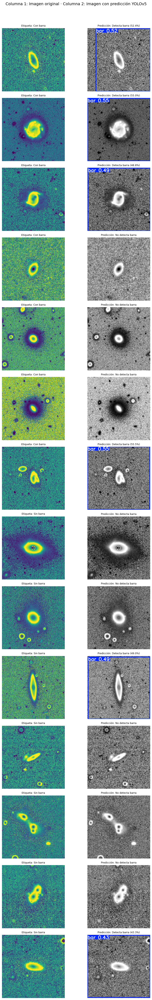

In [18]:
import os
import shutil
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# 1. Paths
image_base_path = '/Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/data/processed'
csv_path = '/Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/data/dataset.csv'
yolov5_detect_script = '/Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/notebooks/yolov5/detect.py'
model_weights = '/Users/isaidoropeza/Documents/MNA_Proyecto_Integrador/Baseline/itesm-mna-barred-galaxies-main/notebooks/yolov5/runs/train/bar_detector_sample/weights/best.pt'
output_name = 'yolov5_selected'
output_dir = f'yolov5/runs/detect/{output_name}'
output_labels_dir = os.path.join(output_dir, 'labels')
input_dir = 'test_yolov5_input'
os.makedirs(input_dir, exist_ok=True)

# 2. Cargar CSV y rutas
df = pd.read_csv(csv_path)
df['has_bar'] = df['Bars'].apply(lambda x: 1 if x > 0 else 0)
df['image_path'] = df['name'].apply(lambda x: os.path.join(image_base_path, f"{x}.png"))
df = df[df['image_path'].apply(os.path.exists)]

# 3. Seleccionar imágenes balanceadas
with_bar = df[df['has_bar'] == 1].sample(min(7, len(df[df['has_bar'] == 1])), random_state=42)
without_bar = df[df['has_bar'] == 0].sample(min(7, len(df[df['has_bar'] == 0])), random_state=42)
selected_df = pd.concat([with_bar, without_bar]).reset_index(drop=True)
selected_paths = selected_df['image_path'].tolist()
selected_names = selected_df['name'].tolist()
n = len(selected_paths)

# 4. Copiar imágenes a carpeta de entrada
for path in selected_paths:
    shutil.copy(path, input_dir)

# 5. Ejecutar detección con YOLOv5 (guardar imágenes por defecto)
!python {yolov5_detect_script} \
  --weights {model_weights} \
  --source {input_dir} \
  --conf 0.4 \
  --img 416 \
  --save-txt \
  --save-conf \
  --name {output_name}

# 6. Mostrar resultados
fig, axs = plt.subplots(n, 2, figsize=(10, n * 3.5))

for i in range(n):
    img_path = selected_paths[i]
    img = Image.open(img_path)
    label_real = "Con barra" if selected_df.iloc[i]['has_bar'] == 1 else "Sin barra"
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(f"Etiqueta: {label_real}", fontsize=9)
    axs[i, 0].axis('off')

    # Imagen predicha con cajas
    img_base = os.path.splitext(os.path.basename(img_path))[0]
    pred_img_path = os.path.join(output_dir, f"{img_base}.jpg")
    if not os.path.exists(pred_img_path):
        pred_img_path = os.path.join(output_dir, f"{img_base}.png")
    pred_img = Image.open(pred_img_path) if os.path.exists(pred_img_path) else img

    # Leer predicción de etiquetas .txt
    label_path = os.path.join(output_labels_dir, f"{selected_names[i]}.txt")
    if os.path.exists(label_path):
        with open(label_path) as f:
            lines = f.readlines()
        barra_conf = [float(line.split()[5]) for line in lines if int(line.split()[0]) == 0]
        if barra_conf:
            max_conf = max(barra_conf)
            label_pred = f"Detecta barra ({max_conf*100:.1f}%)"
        else:
            label_pred = "No detecta barra"
    else:
        label_pred = "No detecta barra"

    axs[i, 1].imshow(pred_img)
    axs[i, 1].set_title(f"Predicción: {label_pred}", fontsize=9)
    axs[i, 1].axis('off')

plt.tight_layout()
plt.suptitle("Columna 1: Imagen original · Columna 2: Imagen con predicción YOLOv5", fontsize=14, y=1.02)
plt.show()


#### 